<a href="https://colab.research.google.com/github/tinaghimire/data-mining/blob/main/Lab-2_Decision_Tree/DecisionTree_redwine.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Decision Tree

## Data set
[Wine Quality](https://archive.ics.uci.edu/dataset/186/wine+quality)

- Two datasets: Red wine and White wine.
- Can be used for classification and regression.
- Outliers detection algorithm could be used.
- Feature selection can also be done.
- Total features for both white and red wine are 11.
- The target is to predict the quality score of the wine ranging from 0 to 10.

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.tree import plot_tree
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split

from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report

In [ ]:
# Red wine dataset
# data_df = pd.read_csv("/content/drive/MyDrive/fuse/winequality-red.csv")
data_df = pd.read_excel("/content/drive/MyDrive/fuse/winequality-red.xlsx")
data_df.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5


In [ ]:
data_df[data_df.duplicated()]

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
4,7.4,0.700,0.00,1.90,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5
11,7.5,0.500,0.36,6.10,0.071,17.0,102.0,0.99780,3.35,0.80,10.5,5
27,7.9,0.430,0.21,1.60,0.106,10.0,37.0,0.99660,3.17,0.91,9.5,5
40,7.3,0.450,0.36,5.90,0.074,12.0,87.0,0.99780,3.33,0.83,10.5,5
65,7.2,0.725,0.05,4.65,0.086,4.0,11.0,0.99620,3.41,0.39,10.9,5
...,...,...,...,...,...,...,...,...,...,...,...,...
1563,7.2,0.695,0.13,2.00,0.076,12.0,20.0,0.99546,3.29,0.54,10.1,5
1564,7.2,0.695,0.13,2.00,0.076,12.0,20.0,0.99546,3.29,0.54,10.1,5
1567,7.2,0.695,0.13,2.00,0.076,12.0,20.0,0.99546,3.29,0.54,10.1,5
1581,6.2,0.560,0.09,1.70,0.053,24.0,32.0,0.99402,3.54,0.60,11.3,5


In [ ]:
# Before
data_df.shape

(1599, 12)

In [ ]:
# Remove duplicated data
data_df = data_df.drop_duplicates()
data_df.shape

(1359, 12)

In [ ]:
original_df = data_df.copy()

In [ ]:
data_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1359 entries, 0 to 1598
Data columns (total 12 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   fixed acidity         1359 non-null   float64
 1   volatile acidity      1359 non-null   float64
 2   citric acid           1359 non-null   float64
 3   residual sugar        1359 non-null   float64
 4   chlorides             1359 non-null   float64
 5   free sulfur dioxide   1359 non-null   float64
 6   total sulfur dioxide  1359 non-null   float64
 7   density               1359 non-null   float64
 8   pH                    1359 non-null   float64
 9   sulphates             1359 non-null   float64
 10  alcohol               1359 non-null   float64
 11  quality               1359 non-null   int64  
dtypes: float64(11), int64(1)
memory usage: 138.0 KB


In [ ]:
data_df.describe()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
count,1359.000000,1359.000000,1359.000000,1359.000000,1359.000000,1359.000000,1359.000000,1359.000000,1359.000000,1359.000000,1359.000000,1359.000000
mean,8.310596,0.529478,0.272333,2.523400,0.088124,15.893304,46.825975,0.996709,3.309787,0.658705,10.432315,5.623252
std,1.736990,0.183031,0.195537,1.352314,0.049377,10.447270,33.408946,0.001869,0.155036,0.170667,1.082065,0.823578
min,4.600000,0.120000,0.000000,0.900000,0.012000,1.000000,6.000000,0.990070,2.740000,0.330000,8.400000,3.000000
25%,7.100000,0.390000,0.090000,1.900000,0.070000,7.000000,22.000000,0.995600,3.210000,0.550000,9.500000,5.000000
50%,7.900000,0.520000,0.260000,2.200000,0.079000,14.000000,38.000000,0.996700,3.310000,0.620000,10.200000,6.000000
75%,9.200000,0.640000,0.430000,2.600000,0.091000,21.000000,63.000000,0.997820,3.400000,0.730000,11.100000,6.000000
max,15.900000,1.580000,1.000000,15.500000,0.611000,72.000000,289.000000,1.003690,4.010000,2.000000,14.900000,8.000000


In [ ]:
data_df.select_dtypes('number')

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5
1,7.8,0.880,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8,5
2,7.8,0.760,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8,5
3,11.2,0.280,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8,6
5,7.4,0.660,0.00,1.8,0.075,13.0,40.0,0.99780,3.51,0.56,9.4,5
...,...,...,...,...,...,...,...,...,...,...,...,...
1593,6.8,0.620,0.08,1.9,0.068,28.0,38.0,0.99651,3.42,0.82,9.5,6
1594,6.2,0.600,0.08,2.0,0.090,32.0,44.0,0.99490,3.45,0.58,10.5,5
1595,5.9,0.550,0.10,2.2,0.062,39.0,51.0,0.99512,3.52,0.76,11.2,6
1597,5.9,0.645,0.12,2.0,0.075,32.0,44.0,0.99547,3.57,0.71,10.2,5


<Axes: xlabel='fixed acidity', ylabel='Count'>

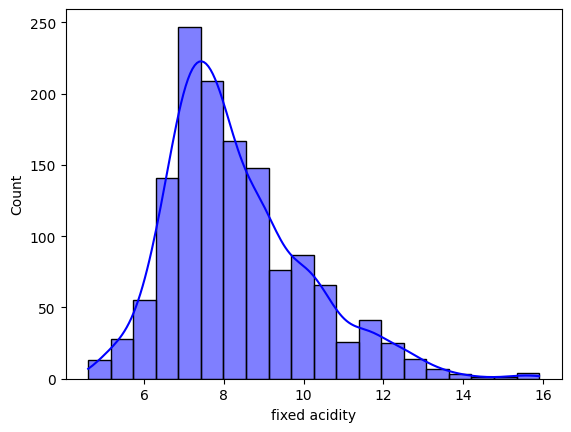

In [ ]:
# plt.hist(data_df['fixed acidity'])
sns.histplot(data_df['fixed acidity'], kde=True, color='blue', bins=20)

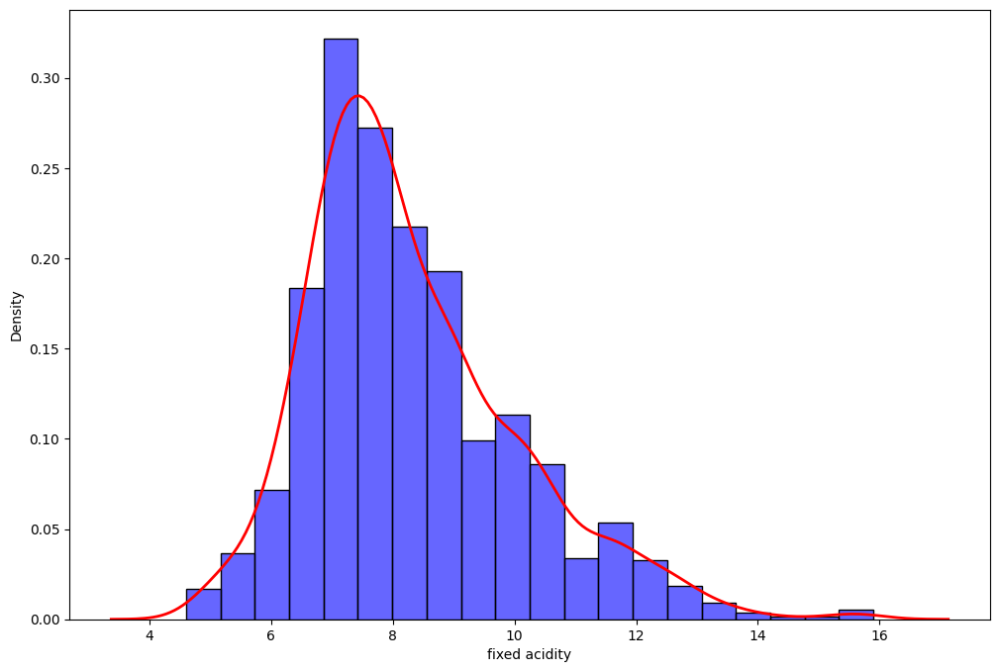

In [ ]:
plt.figure(figsize=(12, 8))
# sns.histplot(data_df['fixed acidity'], kde=True, color='blue', bins=20)
sns.histplot(data_df['fixed acidity'], kde=False, color='blue', bins=20, alpha=0.6, stat='density')
sns.kdeplot(data_df['fixed acidity'], color='red', linewidth=2)
plt.show()

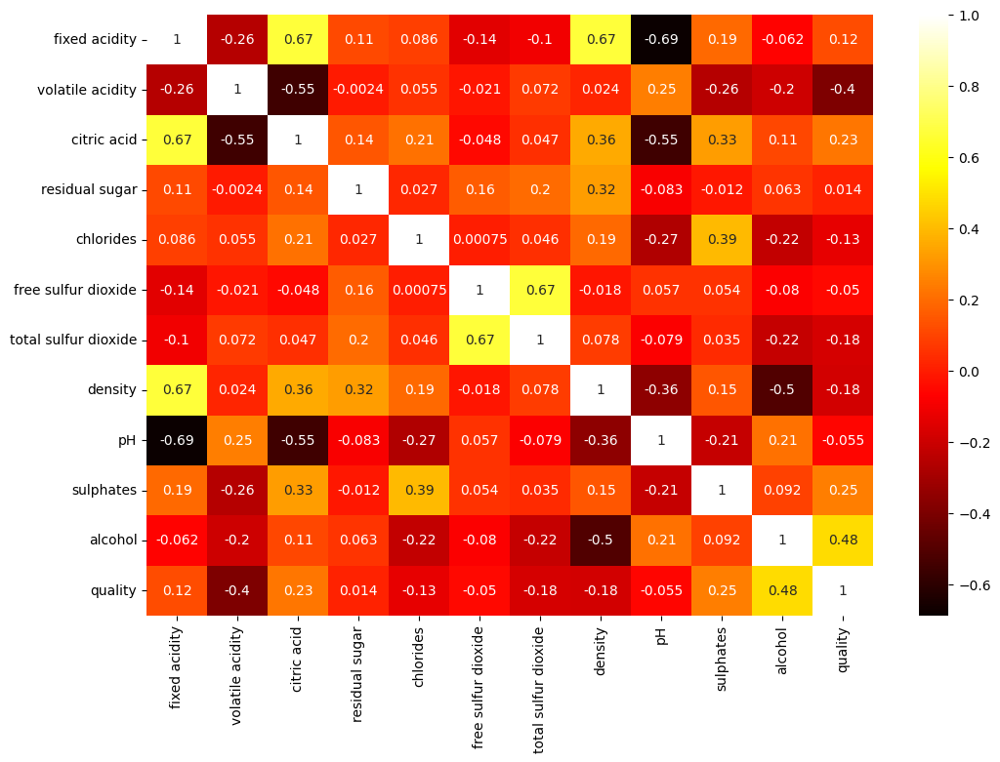

In [ ]:
# Correlation plot and heatmap
plt.figure(figsize=(12,8))
sns.heatmap(data_df.corr(), cmap='hot', annot=True)
plt.show()

# Split features and target

In [ ]:
X = data_df.drop("quality", axis = 1)
y = data_df["quality"]

# Outliers


In [ ]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
scaled_data_df = scaler.fit_transform(X)

In [ ]:
scaled_data_df = pd.DataFrame(scaled_data_df, columns=X.columns)
scaled_data_df.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol
0,-0.524431,0.932000,-1.393258,-0.461157,-0.245623,-0.468554,-0.384050,0.584003,1.291872,-0.578561,-0.954374
1,-0.294063,1.915800,-1.393258,0.056665,0.200094,0.872003,0.604073,0.048737,-0.708395,0.124822,-0.584575
2,-0.294063,1.259934,-1.188617,-0.165259,0.078535,-0.085537,0.214813,0.155790,-0.321247,-0.051024,-0.584575
3,1.664067,-1.363534,1.471711,-0.461157,-0.265883,0.105971,0.394471,0.691057,-0.966495,-0.461331,-0.584575
4,-0.524431,0.713378,-1.393258,-0.535132,-0.265883,-0.277045,-0.204391,0.584003,1.291872,-0.578561,-0.954374


# Using box plot

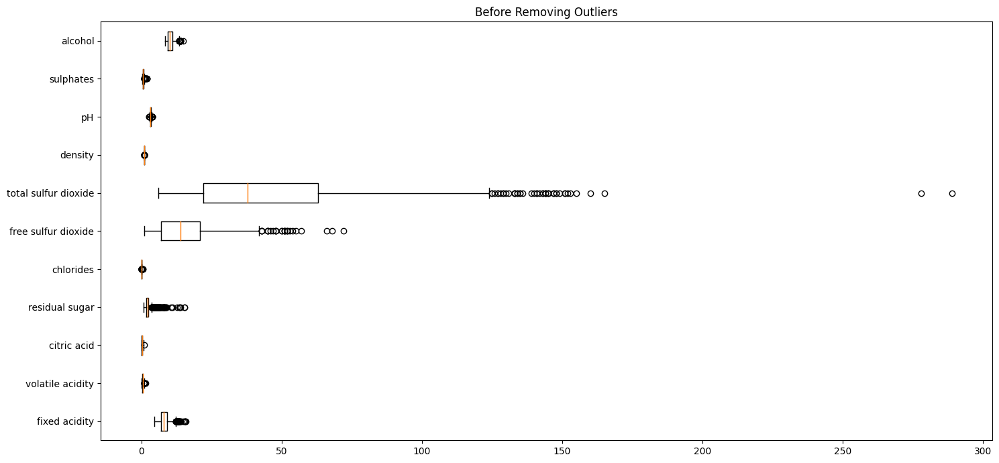

In [ ]:
# Plot boxplots before and after removing outliers
fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(15, 7))

# Before removing outliers
axes.boxplot(X, vert=False)
axes.set_title('Before Removing Outliers')
axes.set_yticklabels(X.columns, rotation=0)

plt.tight_layout()
plt.show()

In [ ]:
Q1 = X.quantile(0.25)
Q3 = X.quantile(0.75)
IQR = Q3 - Q1
IQR

fixed acidity            2.10000
volatile acidity         0.25000
citric acid              0.34000
residual sugar           0.70000
chlorides                0.02100
free sulfur dioxide     14.00000
total sulfur dioxide    41.00000
density                  0.00222
pH                       0.19000
sulphates                0.18000
alcohol                  1.60000
dtype: float64

In [ ]:
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

In [ ]:
cleaned_X = X[~((X < lower_bound) | (X > upper_bound)).any(axis=1)]
cleaned_X.shape

(1019, 11)

In [ ]:
# bool_mask = (z_scores < 2).all(axis=1).values
# data_no_outliers_z = X[bool_mask]
# data_no_outliers_z.shape

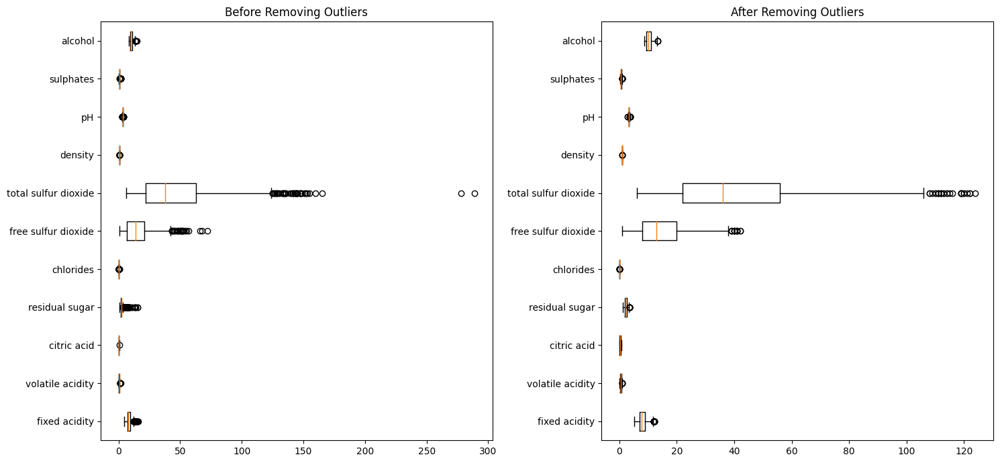

In [ ]:
# Plot boxplots before and after removing outliers
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15, 7))

# Before removing outliers
axes[0].boxplot(X, vert=False)
axes[0].set_title('Before Removing Outliers')
axes[0].set_yticklabels(X.columns, rotation=0)

# After removing outliers
axes[1].boxplot(cleaned_X, vert=False)
axes[1].set_title('After Removing Outliers')
axes[1].set_yticklabels(cleaned_X.columns, rotation=0)

plt.tight_layout()
plt.show()

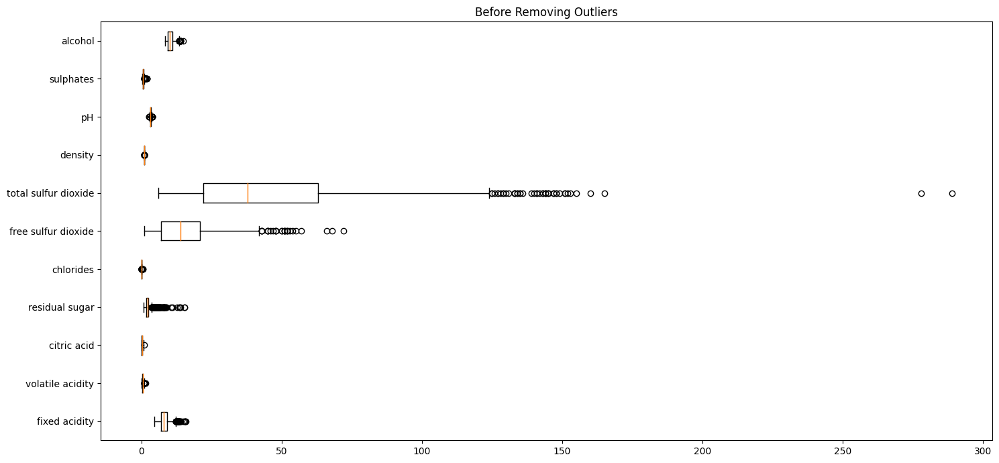

In [ ]:
# Plot boxplots before and after removing outliers
fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(15, 7))

# Before removing outliers
axes.boxplot(X, vert=False)
axes.set_title('Before Removing Outliers')
axes.set_yticklabels(X.columns, rotation=0)

plt.tight_layout()
plt.show()

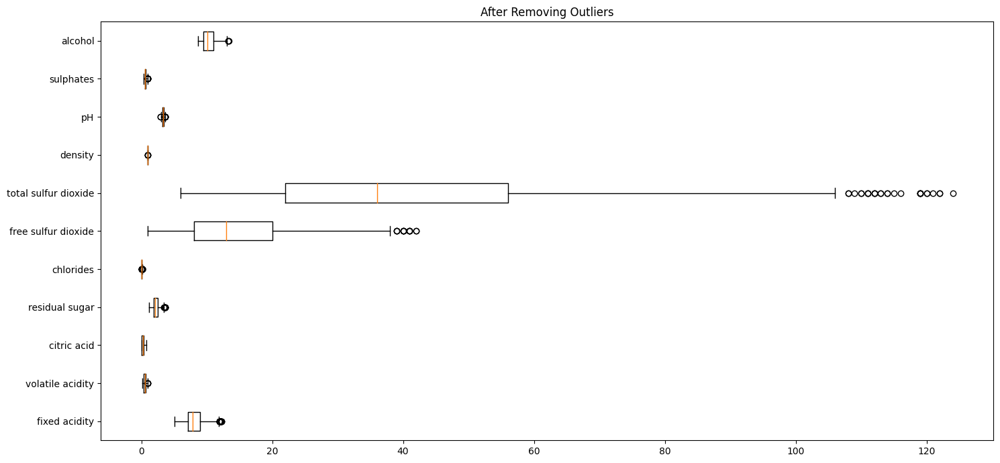

In [ ]:
# Plot boxplots before and after removing outliers
fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(15, 7))

# After removing outliers
axes.boxplot(cleaned_X, vert=False)
axes.set_title('After Removing Outliers')
axes.set_yticklabels(cleaned_X.columns, rotation=0)

plt.tight_layout()
plt.show()

In [ ]:
data_df = cleaned_X.copy()
data_df["quality"] = y
data_df.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6
5,7.4,0.66,0.00,1.8,0.075,13.0,40.0,0.9978,3.51,0.56,9.4,5


In [ ]:
data_df.value_counts("quality") / data_df.shape[0]

quality
5    0.425908
6    0.415113
7    0.112856
4    0.032385
8    0.010795
3    0.002944
Name: count, dtype: float64

In [ ]:
data_df["quality"].unique()

array([5, 6, 7, 4, 8, 3])

Among 1599 instances, 42.59% are scored 5, 39.9% are scored 6, 12.45% scored 7 and remaining are labelled 4, 8, 3. So only 6 scores are defined in this dataset. So, keep only 3 scores 5,6,7.

# Categorize the target


In [ ]:
conditions = [
    data_df["quality"] <= 5,
    data_df["quality"] == 6,
    data_df["quality"] > 6
]
choices = ["bad", "neutral", "good"]

# Apply conditions using np.select
data_df["quality"] = np.select(conditions, choices, default="unknown")

In [ ]:
data_df.value_counts("quality") / data_df.shape[0]

quality
bad        0.461237
neutral    0.415113
good       0.123651
Name: count, dtype: float64

In [ ]:
# from sklearn.utils import resample

# # Separate each class into different datasets
# bad_quality = data_df[data_df.quality == "bad"]
# neutral_quality = data_df[data_df.quality == "neutral"]
# good_quality = data_df[data_df.quality == "good"]

# # Resample classes 6 and 7 to match class 5 size
# neutral_quality_upsampled = resample(neutral_quality, replace=True, n_samples=len(bad_quality), random_state=42)
# good_quality_upsampled = resample(good_quality, replace=True, n_samples=len(bad_quality), random_state=42)

# # Combine resampled classes with the majority class
# original_data = pd.concat([bad_quality, neutral_quality, good_quality])
# data_balanced = pd.concat([bad_quality, neutral_quality_upsampled, good_quality_upsampled])

# # Proceed with the same preprocessing steps on data_balanced
# data_balanced['quality'].value_counts()

quality
bad        470
neutral    470
good       470
Name: count, dtype: int64

In [ ]:
# from collections import Counter

In [ ]:
# original_class_counts = Counter(original_data['quality'])
# original_class_counts

Counter({'bad': 470, 'neutral': 423, 'good': 126})

In [ ]:
# resampled_class_counts = Counter(data_balanced['quality'])
# resampled_class_counts

Counter({'bad': 470, 'neutral': 470, 'good': 470})

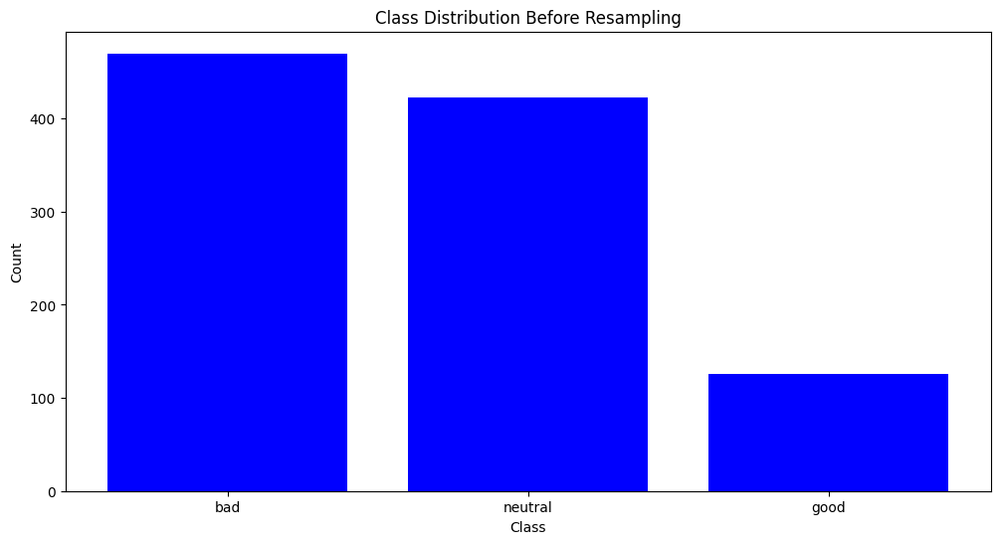

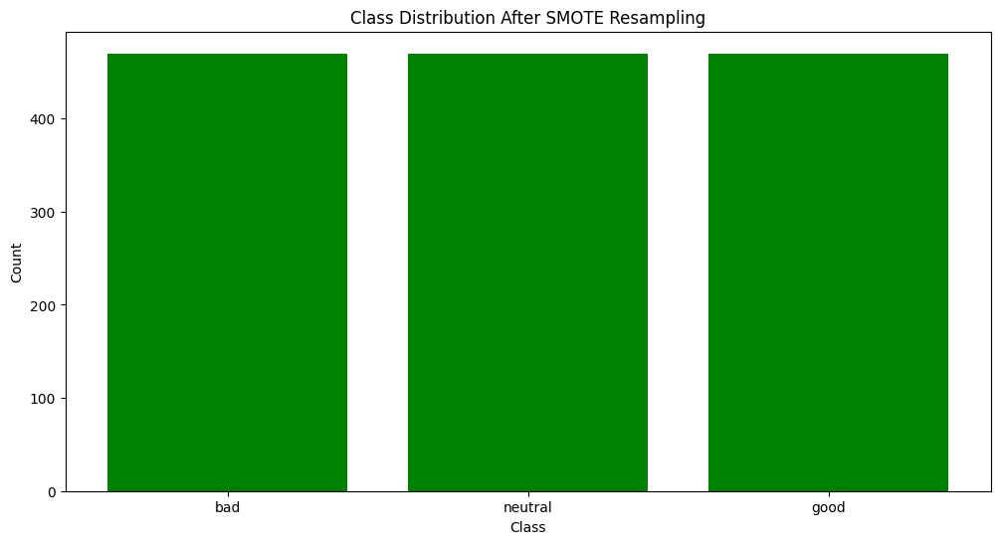

In [ ]:
# # Plotting
# plt.figure(figsize=(12, 6))

# # Plot before resampling
# plt.bar(original_class_counts.keys(), original_class_counts.values(), color='blue')
# plt.title('Class Distribution Before Resampling')
# plt.xlabel('Class')
# plt.ylabel('Count')
# plt.show()

# # Plot after resampling
# plt.figure(figsize=(12, 6))

# plt.bar(resampled_class_counts.keys(), resampled_class_counts.values(), color='green')
# plt.title('Class Distribution After SMOTE Resampling')
# plt.xlabel('Class')
# plt.ylabel('Count')
# plt.show()

In [ ]:
# data_df = data_balanced.copy()
# data_df.head()
# data_df['quality'].value_counts()

quality
bad        470
neutral    470
good       470
Name: count, dtype: int64

In [ ]:
X_scaled = data_df.drop("quality", axis = 1)
y = data_df["quality"]

In [ ]:
from sklearn.preprocessing import LabelEncoder

# Initialize LabelEncoder
label_encoder = LabelEncoder()

# Fit and transform the target variable
y_encoded = label_encoder.fit_transform(y)

print("Encoded target:", y_encoded)

Encoded target: [0 0 0 ... 1 1 1]


In [ ]:
from sklearn.linear_model import ElasticNet

elastic_net = ElasticNet(alpha=0.1, l1_ratio=0.5)  # Adjust alpha and l1_ratio as needed
elastic_net.fit(X_scaled, y_encoded)

feature_importance = elastic_net.coef_

selected_features = X.columns[elastic_net.coef_ != 0].tolist()

print(f"Selected features based on ElasticNet: {selected_features}")

Selected features based on ElasticNet: ['fixed acidity', 'free sulfur dioxide', 'total sulfur dioxide', 'alcohol']


Selected features based on ElasticNet: ['fixed acidity', 'volatile acidity', 'chlorides', 'total sulfur dioxide', 'sulphates', 'alcohol']


# Split features and target

In [ ]:
X = X_scaled[selected_features]
y = data_df["quality"]
X.head()

,fixed acidity,free sulfur dioxide,total sulfur dioxide,alcohol
0,7.4,11.0,34.0,9.4
1,7.8,25.0,67.0,9.8
2,7.8,15.0,54.0,9.8
5,7.4,13.0,40.0,9.4
6,7.9,15.0,59.0,9.4


# Converting Continuous Data



In [ ]:
# Number of bins
num_bins = 5

# Discretize each feature
for column in X.columns:
    X[column] = pd.cut(X[column], bins=num_bins, labels=False)

print("\nDataFrame after discretization:")
print(X)


DataFrame after discretization:
      fixed acidity  free sulfur dioxide  total sulfur dioxide  alcohol
0                 1                    1                     1        0
1                 1                    2                     2        1
2                 1                    1                     2        1
5                 1                    1                     1        0
6                 1                    1                     2        0
...             ...                  ...                   ...      ...
858               4                    1                     1        2
334               1                    1                     1        3
828               1                    4                     1        4
1093              2                    1                     1        3
481               2                    0                     0        3

[1410 rows x 4 columns]


<ipython-input-453-8d5d2a31d014>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X[column] = pd.cut(X[column], bins=num_bins, labels=False)


In [ ]:
X['alcohol'].value_counts()

alcohol
1    440
2    325
0    320
3    214
4    111
Name: count, dtype: int64

In [ ]:
X.shape, y.shape

((1410, 4), (1410,))

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
X_train.shape, X_test.shape

((1128, 4), (282, 4))

In [ ]:
class_names = []

for classes in y.unique():
  class_names.append(str(classes))

class_names

['bad', 'neutral', 'good']

# Decision Tree using criterion Entropy


In [ ]:
decision_tree = DecisionTreeClassifier(criterion='entropy', random_state = 42)
decision_tree.fit(X_train, y_train)

DecisionTreeClassifier(criterion='entropy', random_state=42)

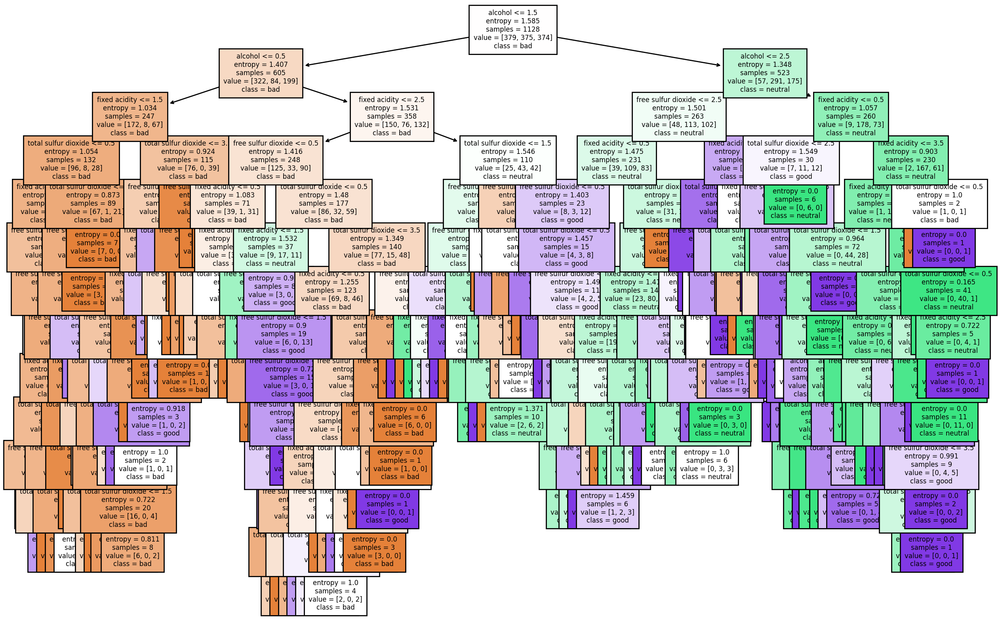

In [ ]:
fig, axes = plt.subplots(nrows = 1, ncols = 1, figsize = (15,10), dpi=200)
axes.plot(linewidth=0)
_ = plot_tree(decision_tree,
              feature_names = X.columns,
              class_names=class_names,
              filled=True,
              fontsize = 6)

Unless we apply some early stopping or pruning techniques, decision trees are highly prone to overfitting, Decision Tree is highly prone to overfitting.

In [ ]:
y_pred = decision_tree.predict(X_test)

In [ ]:
pd.DataFrame([y_pred, y_test], index=['Predicted', 'True'])

,0,1,2,3,4,5,6,7,8,9,...,272,273,274,275,276,277,278,279,280,281
Predicted,bad,bad,good,bad,neutral,good,bad,bad,good,bad,...,bad,bad,good,bad,neutral,good,bad,bad,bad,neutral
True,bad,neutral,good,bad,neutral,neutral,bad,bad,good,bad,...,bad,bad,good,neutral,neutral,good,neutral,bad,bad,neutral


Text(50.722222222222214, 0.5, 'True Labels')

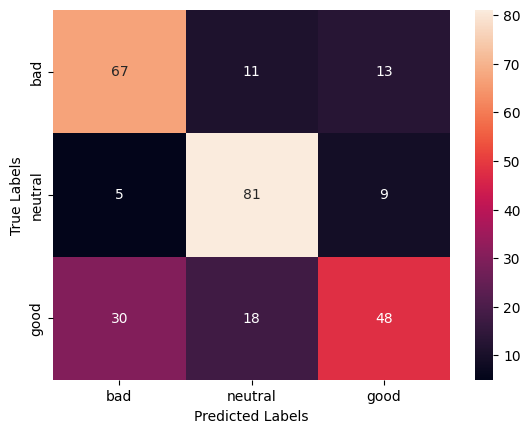

In [ ]:
# Confusion matrix
con_matrix = confusion_matrix(y_test, y_pred)
ax = sns.heatmap(con_matrix, annot=True, fmt='d', xticklabels = y.unique(), yticklabels = y.unique())
ax.set_xlabel('Predicted Labels')
ax.set_ylabel('True Labels')

In [ ]:
class_report = classification_report(y_test, y_pred)
print(class_report)

              precision    recall  f1-score   support

         bad       0.66      0.74      0.69        91
        good       0.74      0.85      0.79        95
     neutral       0.69      0.50      0.58        96

    accuracy                           0.70       282
   macro avg       0.69      0.70      0.69       282
weighted avg       0.69      0.70      0.69       282



# Decision Tree using criterion Gini


In [ ]:
decision_tree = DecisionTreeClassifier(random_state = 42) # criterion='gini' by default
decision_tree.fit(X_train, y_train)

DecisionTreeClassifier(random_state=42)

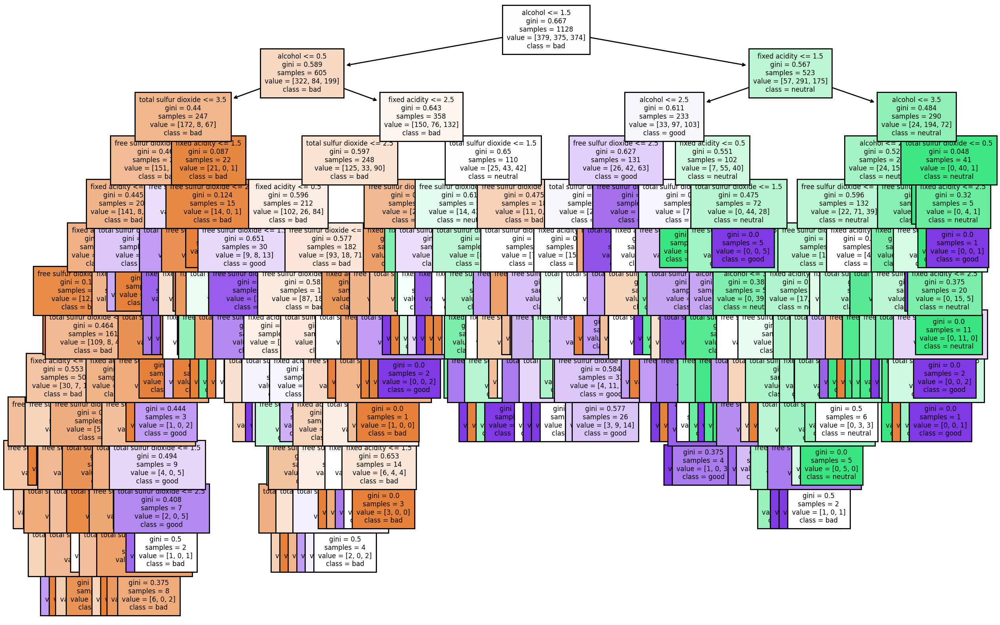

In [ ]:
fig, axes = plt.subplots(nrows = 1, ncols = 1, figsize = (15,10), dpi=200)
axes.plot(linewidth=0)
_ = plot_tree(decision_tree,
              feature_names = X.columns,
              class_names=class_names,
              filled=True,
              fontsize=6)

Unless we apply some early stopping or pruning techniques, decision trees are highly prone to overfitting, Decision Tree is highly prone to overfitting.

In [ ]:
y_pred = decision_tree.predict(X_test)

In [ ]:
pd.DataFrame([y_pred, y_test], index=['Predicted', 'True'])

,0,1,2,3,4,5,6,7,8,9,...,272,273,274,275,276,277,278,279,280,281
Predicted,bad,bad,good,bad,neutral,good,bad,bad,good,bad,...,bad,bad,good,bad,neutral,good,bad,bad,bad,neutral
True,bad,neutral,good,bad,neutral,neutral,bad,bad,good,bad,...,bad,bad,good,neutral,neutral,good,neutral,bad,bad,neutral


Text(50.722222222222214, 0.5, 'True Labels')

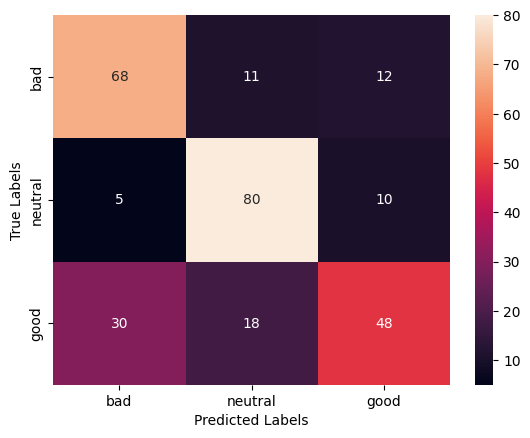

In [ ]:
# Confusion matrix
con_matrix = confusion_matrix(y_test, y_pred)
ax = sns.heatmap(con_matrix, annot=True, fmt='d', xticklabels = y.unique(), yticklabels = y.unique())
ax.set_xlabel('Predicted Labels')
ax.set_ylabel('True Labels')

In [ ]:
class_report = classification_report(y_test, y_pred)
print(class_report)

              precision    recall  f1-score   support

         bad       0.66      0.75      0.70        91
        good       0.73      0.84      0.78        95
     neutral       0.69      0.50      0.58        96

    accuracy                           0.70       282
   macro avg       0.69      0.70      0.69       282
weighted avg       0.69      0.70      0.69       282



# Decision Tree using criterion Log loss


In [ ]:
decision_tree = DecisionTreeClassifier(criterion='log_loss', random_state = 42)
decision_tree.fit(X_train, y_train)

DecisionTreeClassifier(criterion='log_loss', random_state=42)

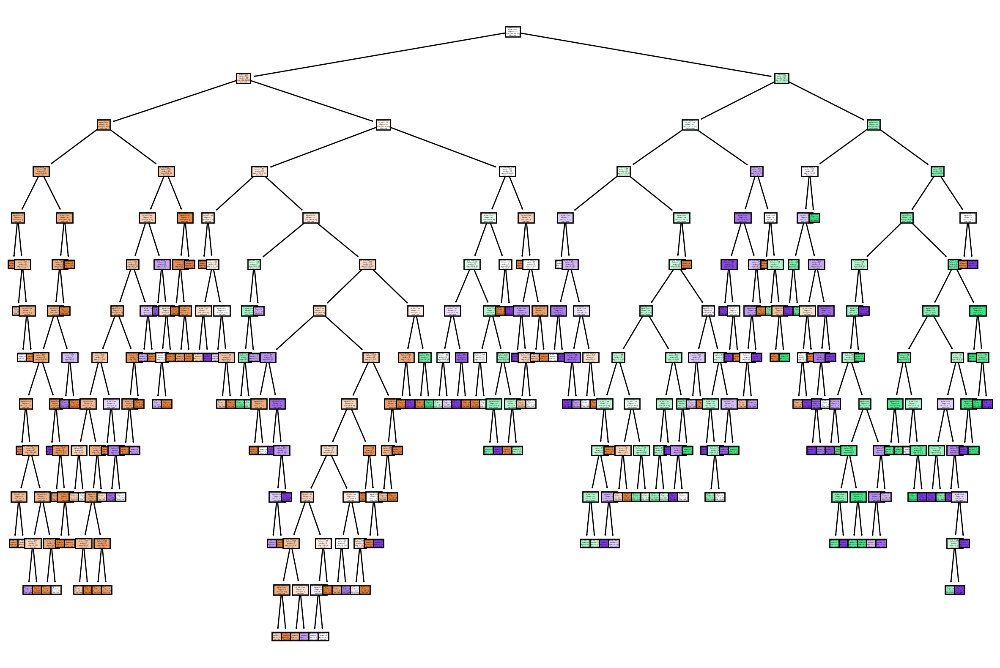

In [ ]:
fig, axes = plt.subplots(nrows = 1, ncols = 1, figsize = (15,10), dpi=200)
axes.plot(linewidth=0)
_ = plot_tree(decision_tree,
              feature_names = X.columns,
              class_names=class_names,
              filled=True)

Unless we apply some early stopping or pruning techniques, decision trees are highly prone to overfitting, Decision Tree is highly prone to overfitting.

In [ ]:
y_pred = decision_tree.predict(X_test)

In [ ]:
pd.DataFrame([y_pred, y_test], index=['Predicted', 'True'])

,0,1,2,3,4,5,6,7,8,9,...,272,273,274,275,276,277,278,279,280,281
Predicted,bad,bad,good,bad,neutral,good,bad,bad,good,bad,...,bad,bad,good,bad,neutral,good,bad,bad,bad,neutral
True,bad,neutral,good,bad,neutral,neutral,bad,bad,good,bad,...,bad,bad,good,neutral,neutral,good,neutral,bad,bad,neutral


Text(50.722222222222214, 0.5, 'True Labels')

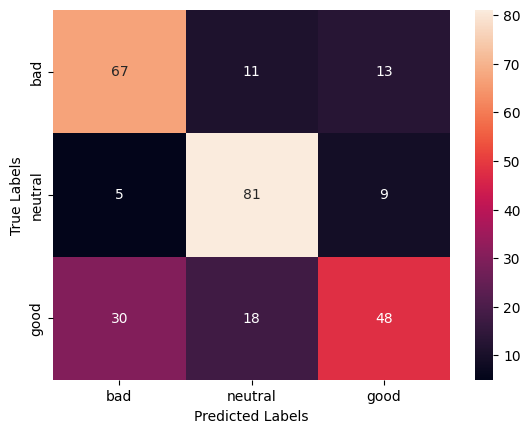

In [ ]:
# Confusion matrix
con_matrix = confusion_matrix(y_test, y_pred)
ax = sns.heatmap(con_matrix, annot=True, fmt='d', xticklabels = y.unique(), yticklabels = y.unique())
ax.set_xlabel('Predicted Labels')
ax.set_ylabel('True Labels')

In [ ]:
class_report = classification_report(y_test, y_pred)
print(class_report)

              precision    recall  f1-score   support

         bad       0.66      0.74      0.69        91
        good       0.74      0.85      0.79        95
     neutral       0.69      0.50      0.58        96

    accuracy                           0.70       282
   macro avg       0.69      0.70      0.69       282
weighted avg       0.69      0.70      0.69       282



# Decision Tree using criterion Gini (Early Stopping)

## Depth Limitation

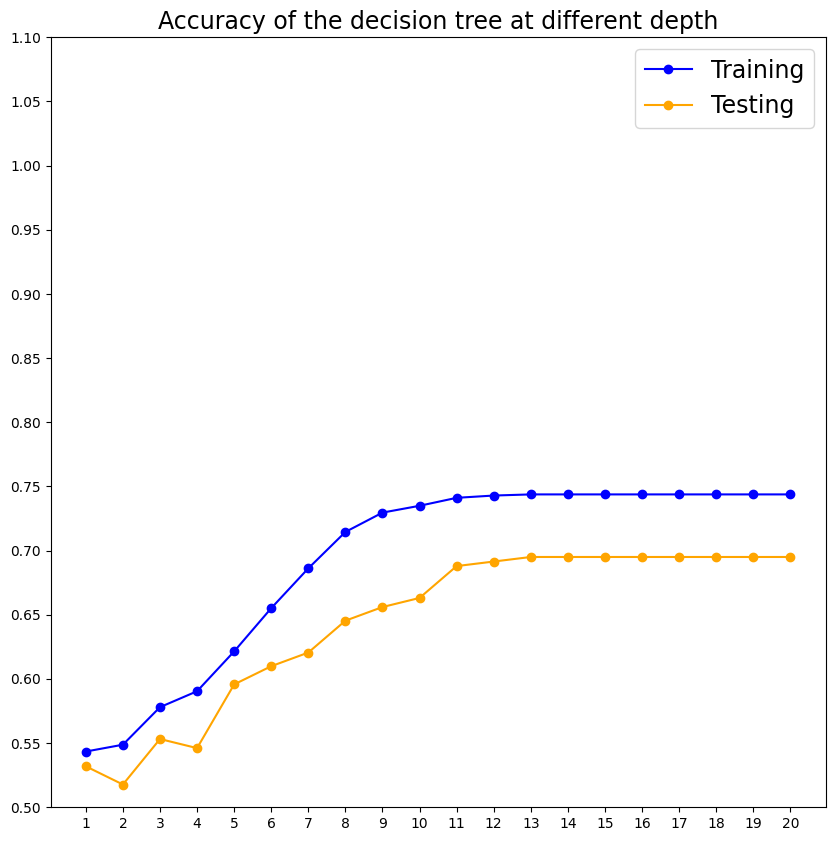

In [ ]:
# Accuracy VS Depth graph
max_depth = 20

decision_tree_list = []
train_accuracy = []
test_accuracy = []

for i in range(max_depth):
  decision_tree = DecisionTreeClassifier(criterion='gini', random_state = 42, max_depth = i+1) # Start from depth 2
  decision_tree.fit(X_train, y_train)
  decision_tree_list.append(decision_tree)

train_accuracy = [decision_tree.score(X_train, y_train) for decision_tree in decision_tree_list]
test_accuracy = [decision_tree.score(X_test, y_test) for decision_tree in decision_tree_list]

plt.figure(figsize = (10,10))
plt.plot(np.arange(1, max_depth + 1, 1), train_accuracy, marker='o', label="Training", color="blue")
plt.plot(np.arange(1, max_depth + 1, 1), test_accuracy, marker='o', label="Testing", color="orange")
plt.title("Accuracy of the decision tree at different depth", fontsize = 17)
plt.xticks(np.arange(1, max_depth+1, 1))
plt.yticks(np.arange(0.5, 1.1, 0.05))
plt.legend(fontsize = 17)
plt.show()

In [ ]:
decision_tree_list = []

for i in [11, 12, 13, 20]:
  decision_tree = DecisionTreeClassifier(criterion='gini', random_state = 42, max_depth = i) # Start from depth 2
  decision_tree.fit(X_train, y_train)
  decision_tree_list.append(decision_tree)

train_accuracy = [decision_tree.score(X_train, y_train) for decision_tree in decision_tree_list]
test_accuracy = [decision_tree.score(X_test, y_test) for decision_tree in decision_tree_list]

train_accuracy, test_accuracy
# Depth 11 has the highest accuracy in testing data.

([0.7411347517730497,
  0.7429078014184397,
  0.7437943262411347,
  0.7437943262411347],
 [0.6879432624113475,
  0.6914893617021277,
  0.6950354609929078,
  0.6950354609929078])

### Taking max_depth = 6

In [ ]:
decision_tree = DecisionTreeClassifier(criterion='gini', random_state = 42, max_depth = 13)
decision_tree.fit(X_train, y_train)

DecisionTreeClassifier(max_depth=13, random_state=42)

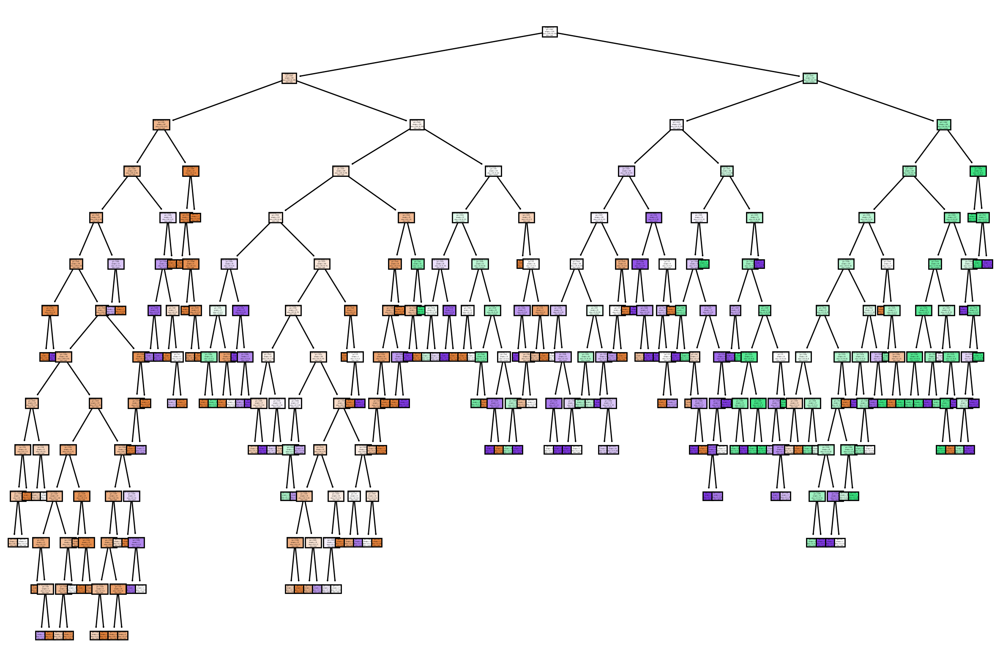

In [ ]:
fig, axes = plt.subplots(nrows = 1, ncols = 1, figsize = (15,10), dpi=200)
axes.plot(linewidth=0)
_ = plot_tree(decision_tree,
              feature_names = X.columns,
              class_names=class_names,
              filled=True)

Unless we apply some early stopping or pruning techniques, decision trees are highly prone to overfitting, Decision Tree is highly prone to overfitting.

In [ ]:
y_pred = decision_tree.predict(X_test)

In [ ]:
pd.DataFrame([y_pred, y_test], index=['Predicted', 'True'])

,0,1,2,3,4,5,6,7,8,9,...,272,273,274,275,276,277,278,279,280,281
Predicted,bad,bad,good,bad,neutral,good,bad,bad,good,bad,...,bad,bad,good,bad,neutral,good,bad,bad,bad,neutral
True,bad,neutral,good,bad,neutral,neutral,bad,bad,good,bad,...,bad,bad,good,neutral,neutral,good,neutral,bad,bad,neutral


Text(50.722222222222214, 0.5, 'True Labels')

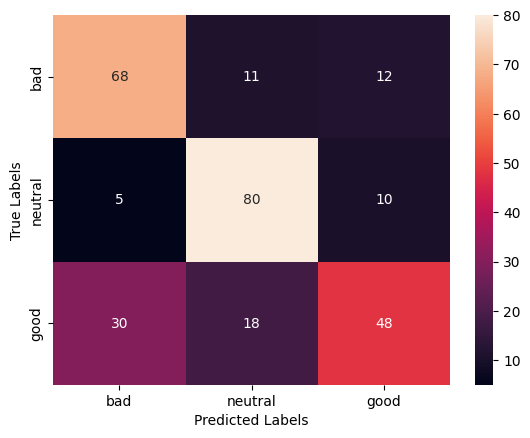

In [ ]:
# Confusion matrix
con_matrix = confusion_matrix(y_test, y_pred)
ax = sns.heatmap(con_matrix, annot=True, fmt='d', xticklabels = y.unique(), yticklabels = y.unique())
ax.set_xlabel('Predicted Labels')
ax.set_ylabel('True Labels')

In [ ]:
class_report = classification_report(y_test, y_pred)
print(class_report)

              precision    recall  f1-score   support

         bad       0.66      0.75      0.70        91
        good       0.73      0.84      0.78        95
     neutral       0.69      0.50      0.58        96

    accuracy                           0.70       282
   macro avg       0.69      0.70      0.69       282
weighted avg       0.69      0.70      0.69       282



# Decision Tree using criterion Entropy (Early Stopping)

## Impurity Threshold

Done to avoid splitting of nodes, which doesnot produce significantly more pure node.

In [ ]:
# min_impurity_decreases = np.linspace(0, 0.05, 10)

# # Train Decision Tree models with different min_impurity_decrease values
# accuracies = []
# for min_impurity_decrease in min_impurity_decreases:
#     decision_tree = DecisionTreeClassifier(criterion='gini', random_state=42, min_impurity_decrease=min_impurity_decrease)
#     decision_tree.fit(X_train, y_train)
#     accuracy = decision_tree.score(X_test, y_test)
#     accuracies.append(accuracy)

# # Plot accuracy vs. min_impurity_decrease
# plt.figure(figsize=(10, 6))
# plt.plot(min_impurity_decreases, accuracies, marker='o', linestyle='-', color='b')
# plt.title('Accuracy vs. min_impurity_decrease')
# plt.xlabel('min_impurity_decrease')
# plt.ylabel('Accuracy')
# plt.grid(True)
# plt.show()

In [ ]:
# min_impurity_decrease to specify how much impurity reduction needed for splitting
decision_tree = DecisionTreeClassifier(criterion='gini', random_state = 42, min_impurity_decrease=0.0005)
decision_tree.fit(X_train, y_train)

DecisionTreeClassifier(min_impurity_decrease=0.0005, random_state=42)

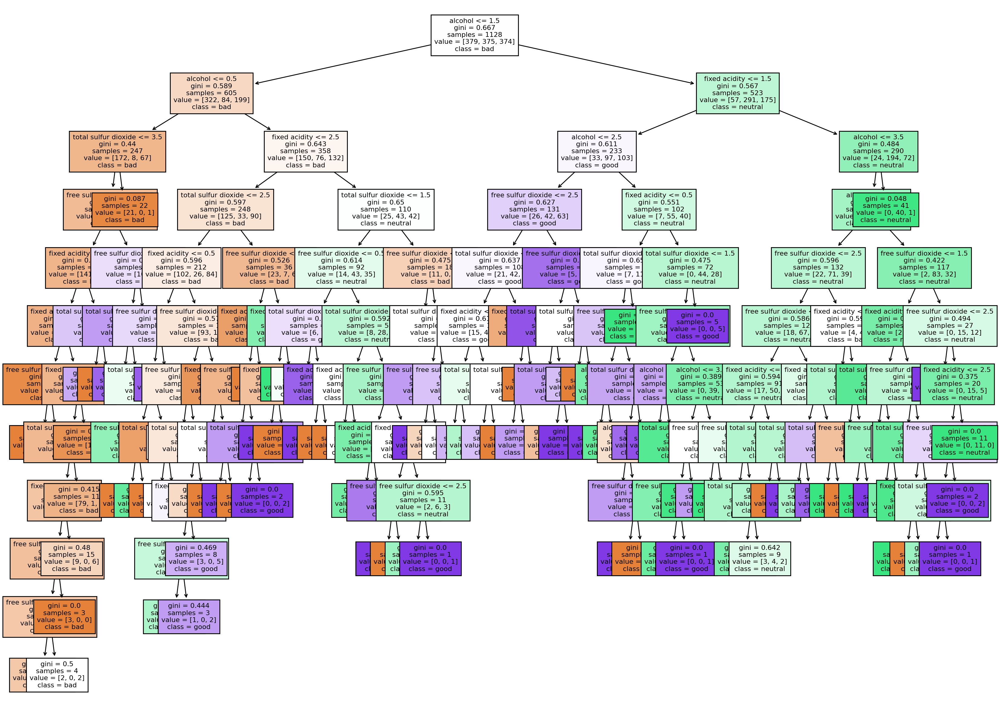

In [ ]:
fig, axes = plt.subplots(nrows = 1, ncols = 1, figsize = (20,15), dpi=200)
axes.plot(linewidth=0)
_ = plot_tree(decision_tree,
              feature_names = X.columns,
              class_names=class_names,
              filled=True,
              fontsize = 8)

Unless we apply some early stopping or pruning techniques, decision trees are highly prone to overfitting, Decision Tree is highly prone to overfitting.

In [ ]:
y_pred = decision_tree.predict(X_test)

In [ ]:
pd.DataFrame([y_pred, y_test], index=['Predicted', 'True'])

,0,1,2,3,4,5,6,7,8,9,...,272,273,274,275,276,277,278,279,280,281
Predicted,bad,bad,good,bad,good,good,bad,bad,good,bad,...,bad,bad,good,bad,neutral,good,bad,bad,bad,neutral
True,bad,neutral,good,bad,neutral,neutral,bad,bad,good,bad,...,bad,bad,good,neutral,neutral,good,neutral,bad,bad,neutral


Text(50.722222222222214, 0.5, 'True Labels')

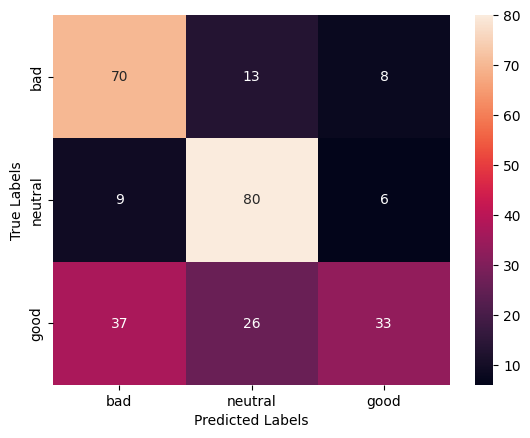

In [ ]:
# Confusion matrix
con_matrix = confusion_matrix(y_test, y_pred)
ax = sns.heatmap(con_matrix, annot=True, fmt='d', xticklabels = y.unique(), yticklabels = y.unique())
ax.set_xlabel('Predicted Labels')
ax.set_ylabel('True Labels')

In [ ]:
class_report = classification_report(y_test, y_pred)
print(class_report)

              precision    recall  f1-score   support

         bad       0.60      0.77      0.68        91
        good       0.67      0.84      0.75        95
     neutral       0.70      0.34      0.46        96

    accuracy                           0.65       282
   macro avg       0.66      0.65      0.63       282
weighted avg       0.66      0.65      0.63       282



# Decision Tree using criterion Entropy (Early Stopping)

## Minimum samples in node

Small samples can either be legitimate samples or outliers (extreme cases) or noise (from wrong labeling).

### Use of Grid Search with cross validation


In [ ]:
from sklearn.model_selection import GridSearchCV

In [ ]:
proportions = np.linspace(0.001, 0.05, 15)  # From 0.1% to 5% of the training samples
min_samples_splits = (proportions * X_train.shape[0]).astype(int)
min_samples_splits = np.unique(min_samples_splits)

param_grid = {
    'min_samples_split': min_samples_splits # 0.01% to 5% of total number of samples
}

param_grid

{'min_samples_split': array([ 1,  5,  9, 12, 16, 20, 24, 28, 32, 36, 40, 44, 48, 52, 56])}

In [ ]:
decision_tree = DecisionTreeClassifier(criterion='gini', random_state = 42)
# decision_tree.fit(X_train, y_train)

grid_search = GridSearchCV(estimator = decision_tree, param_grid=param_grid, cv=5, scoring="accuracy")
grid_search.fit(X_train, y_train)

/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 75.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
5 fits failed with the following error:
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/tree/_classes.py", line 889, in fit
    super().fit(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/tree/_classes.py", line 177, in fit
    self._validate_params()
  File "/usr/local/lib/python3.10/dist-packages/sklearn/base.py", line 600, in _validate_

GridSearchCV(cv=5, estimator=DecisionTreeClassifier(random_state=42),
             param_grid={'min_samples_split': array([ 1,  5,  9, 12, 16, 20, 24, 28, 32, 36, 40, 44, 48, 52, 56])},
             scoring='accuracy')

In [ ]:
print(f"Best parameters found: {grid_search.best_params_}")
print(f"Best cross-validation accuracy: {grid_search.best_score_}")

Best parameters found: {'min_samples_split': 5}
Best cross-validation accuracy: 0.6515909537856441


In [ ]:
# decision_tree = grid_search.best_estimator_
decision_tree = DecisionTreeClassifier(criterion='gini', random_state = 42, min_samples_split = 5)
decision_tree.fit(X_train, y_train)
train_accuracy = decision_tree.score(X_train, y_train)
test_accuracy = decision_tree.score(X_test, y_test)

train_accuracy,test_accuracy

(0.7367021276595744, 0.6914893617021277)

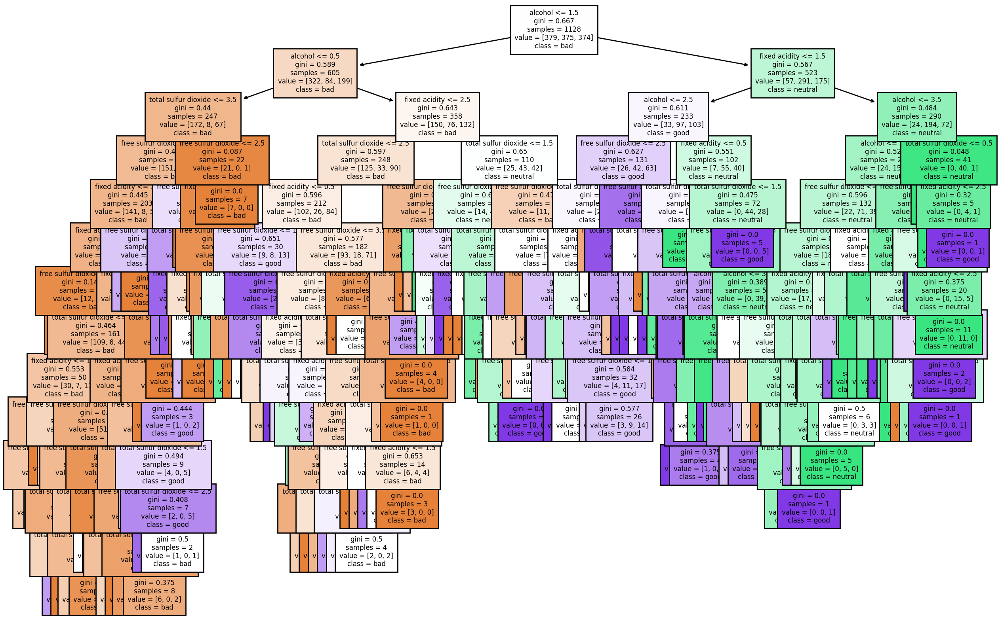

In [ ]:
fig, axes = plt.subplots(nrows = 1, ncols = 1, figsize = (15,10), dpi=200)
axes.plot(linewidth=0)
_ = plot_tree(decision_tree,
              feature_names = X.columns,
              class_names=class_names,
              filled=True,
              fontsize=6)

Unless we apply some early stopping or pruning techniques, decision trees are highly prone to overfitting, Decision Tree is highly prone to overfitting.

In [ ]:
y_pred = decision_tree.predict(X_test)

In [ ]:
pd.DataFrame([y_pred, y_test], index=['Predicted', 'True'])

,0,1,2,3,4,5,6,7,8,9,...,272,273,274,275,276,277,278,279,280,281
Predicted,bad,bad,good,bad,neutral,good,bad,bad,good,bad,...,bad,bad,good,bad,neutral,good,bad,bad,bad,neutral
True,bad,neutral,good,bad,neutral,neutral,bad,bad,good,bad,...,bad,bad,good,neutral,neutral,good,neutral,bad,bad,neutral


Text(50.722222222222214, 0.5, 'True Labels')

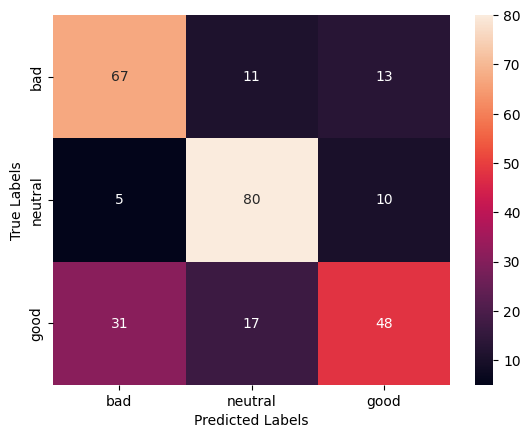

In [ ]:
# Confusion matrix
con_matrix = confusion_matrix(y_test, y_pred)
ax = sns.heatmap(con_matrix, annot=True, fmt='d', xticklabels = y.unique(), yticklabels = y.unique())
ax.set_xlabel('Predicted Labels')
ax.set_ylabel('True Labels')

In [ ]:
class_report = classification_report(y_test, y_pred)
print(class_report)

              precision    recall  f1-score   support

         bad       0.65      0.74      0.69        91
        good       0.74      0.84      0.79        95
     neutral       0.68      0.50      0.57        96

    accuracy                           0.69       282
   macro avg       0.69      0.69      0.68       282
weighted avg       0.69      0.69      0.68       282



# Decision Tree using criterion Entropy

## Pruning


In [ ]:
decision_tree = DecisionTreeClassifier(criterion='gini', random_state = 42)
path = decision_tree.cost_complexity_pruning_path(X_train, y_train)
# decision_tree.fit(X_train, y_train)
ccp_alphas = path.ccp_alphas
ccp_alphas

array([0.00000000e+00, 1.84692671e-05, 4.09165303e-05, 5.18098922e-05,
       5.91016548e-05, 5.91016548e-05, 5.91016548e-05, 7.16383695e-05,
       7.38770686e-05, 8.05931657e-05, 1.18203310e-04, 1.47754137e-04,
       1.59119840e-04, 1.68861871e-04, 1.77304965e-04, 1.90943808e-04,
       1.99072008e-04, 2.27963526e-04, 2.36406619e-04, 2.36406619e-04,
       2.43359755e-04, 2.72001934e-04, 3.03903396e-04, 3.07821119e-04,
       3.18239680e-04, 3.65039633e-04, 3.82596127e-04, 4.04309048e-04,
       4.42298797e-04, 4.43262411e-04, 4.43262411e-04, 4.55927052e-04,
       4.55927052e-04, 4.65028826e-04, 4.67617489e-04, 4.72813239e-04,
       5.30331814e-04, 5.31914894e-04, 5.31914894e-04, 5.62045149e-04,
       5.91016548e-04, 6.58177520e-04, 6.75447484e-04, 6.86793934e-04,
       6.98138298e-04, 7.44680851e-04, 7.59878419e-04, 7.88540500e-04,
       7.96413562e-04, 8.12918366e-04, 8.14758528e-04, 8.25840088e-04,
       8.38168923e-04, 8.51601118e-04, 8.54863222e-04, 8.64902266e-04,
      

In [ ]:
ccp_alphas.shape

(114,)

In [ ]:
decision_tree_list = []
for ccp_alpha in ccp_alphas:
  decision_tree = DecisionTreeClassifier(criterion='gini', random_state = 42, ccp_alpha=ccp_alpha)
  decision_tree.fit(X_train, y_train)
  decision_tree_list.append(decision_tree)

training = [decision_tree.score(X_train, y_train) for decision_tree in decision_tree_list]
testing = [decision_tree.score(X_test, y_test) for decision_tree in decision_tree_list]

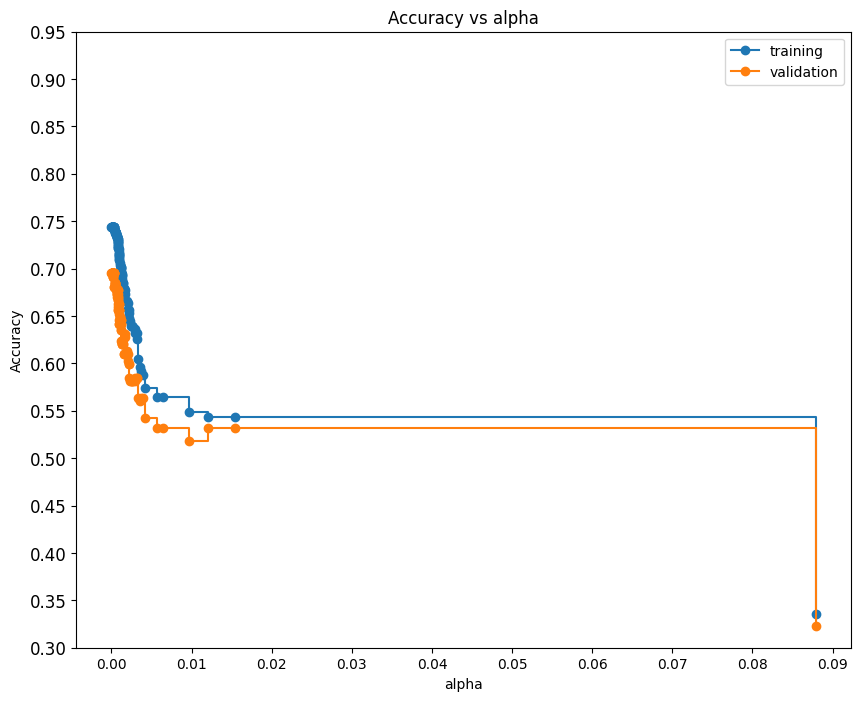

In [ ]:
# Plot of performance on different value of alpha.
plt.figure(figsize = (10,8))
plt.plot(ccp_alphas, training,marker='o', label="training", drawstyle="steps-post")
plt.plot(ccp_alphas, testing, marker='o', label="validation", drawstyle="steps-post")
plt.xlabel("alpha")
plt.ylabel("Accuracy")
plt.title("Accuracy vs alpha")
plt.legend()
locs, labels = plt.xticks()
plt.xticks(np.arange(0, ccp_alphas[-1] +0.01, 0.01))
plt.yticks(np.arange(0.3,1,0.05), fontsize = 12)
plt.show()

In [ ]:
for i, scores in enumerate(testing):
  if scores >= 0.695:
    print(testing[i], i, ccp_alphas[i])

0.6950354609929078 0 0.0
0.6950354609929078 1 1.84692671394808e-05
0.6950354609929078 2 4.091653027823213e-05
0.6950354609929078 3 5.180989223542388e-05
0.6950354609929078 4 5.9101654846334915e-05
0.6950354609929078 5 5.910165484633578e-05
0.6950354609929078 6 5.9101654846336e-05
0.6950354609929078 7 7.163836951071025e-05
0.6950354609929078 8 7.3877068557918e-05
0.6950354609929078 9 8.059316569954946e-05
0.6950354609929078 10 0.00011820330969267157
0.6950354609929078 11 0.00014775413711583924
0.6950354609929078 12 0.00015911983997090305
0.6950354609929078 13 0.00016886187098953068
0.6950354609929078 14 0.00017730496453900735
0.6950354609929078 15 0.00019094380796508487
0.6950354609929078 16 0.00019907200758264784
0.6950354609929078 20 0.00024335975524961834
0.6950354609929078 21 0.0002720019342359759
0.6950354609929078 22 0.0003039033956587153
0.6950354609929078 23 0.00030782111899133394
0.6950354609929078 24 0.0003182396799418074


Here, greater the pruning is, the greater is the complexity reduction, and the value of ccp_alphas is higher.

The maximum testing accuracy is 0.63448. The ccp_alphas for this value are 0.000678, 0.000686, 0.00069.

So, taking higher value of ccp_alpha (Cost Complexity Pruning alpha)
ccp_alpha = 0.00069 i=59

In [ ]:
# Highest value of ccp_alpha
ccp_alpha = ccp_alphas[24]
delta = 0.0000001 # Small number added

decision_tree = DecisionTreeClassifier(criterion='gini', random_state = 42, ccp_alpha=ccp_alpha + delta)
decision_tree.fit(X_train, y_train)

DecisionTreeClassifier(ccp_alpha=0.0003183396799418074, random_state=42)

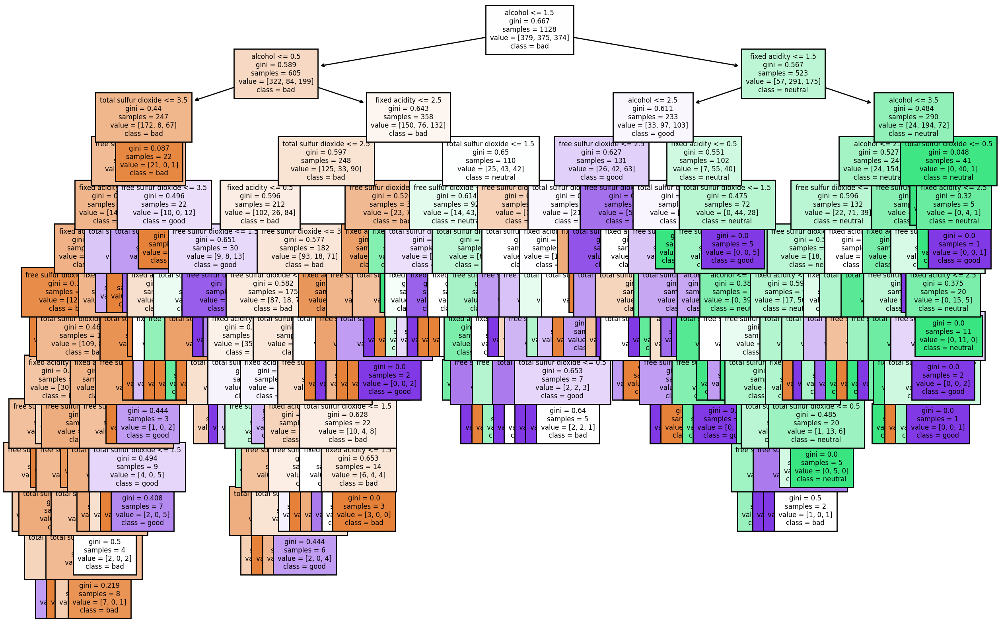

In [ ]:
fig, axes = plt.subplots(nrows = 1, ncols = 1, figsize = (15,10), dpi=200)
axes.plot(linewidth=0)
_ = plot_tree(decision_tree,
              feature_names = X.columns,
              class_names=class_names,
              filled=True,
              fontsize=6)

Unless we apply some early stopping or pruning techniques, decision trees are highly prone to overfitting, Decision Tree is highly prone to overfitting.

In [ ]:
y_pred = decision_tree.predict(X_test)

In [ ]:
pd.DataFrame([y_pred, y_test], index=['Predicted', 'True'])

,0,1,2,3,4,5,6,7,8,9,...,272,273,274,275,276,277,278,279,280,281
Predicted,bad,bad,good,bad,neutral,good,bad,bad,good,bad,...,bad,bad,good,bad,neutral,good,bad,bad,bad,neutral
True,bad,neutral,good,bad,neutral,neutral,bad,bad,good,bad,...,bad,bad,good,neutral,neutral,good,neutral,bad,bad,neutral


Text(50.722222222222214, 0.5, 'True Labels')

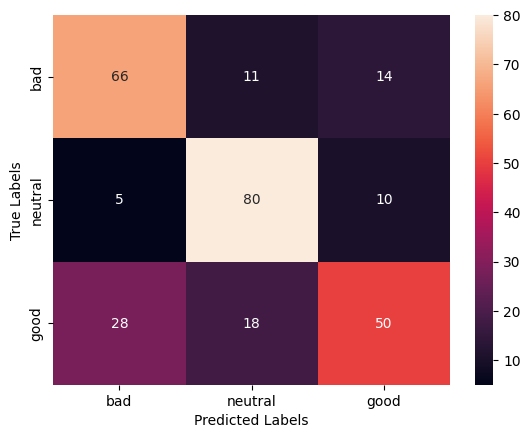

In [ ]:
# Confusion matrix
con_matrix = confusion_matrix(y_test, y_pred)
ax = sns.heatmap(con_matrix, annot=True, fmt='d', xticklabels = y.unique(), yticklabels = y.unique())
ax.set_xlabel('Predicted Labels')
ax.set_ylabel('True Labels')

In [ ]:
class_report = classification_report(y_test, y_pred)
print(class_report)

              precision    recall  f1-score   support

         bad       0.67      0.73      0.69        91
        good       0.73      0.84      0.78        95
     neutral       0.68      0.52      0.59        96

    accuracy                           0.70       282
   macro avg       0.69      0.70      0.69       282
weighted avg       0.69      0.70      0.69       282



# Decision Tree using criterion Entropy using all evaluated parameters from above

In [ ]:
decision_tree = DecisionTreeClassifier(criterion='gini', random_state = 42, max_depth = 13, min_samples_split = 5, ccp_alpha=ccp_alpha + delta)
decision_tree.fit(X_train, y_train)

DecisionTreeClassifier(ccp_alpha=0.0003183396799418074, max_depth=13,
                       min_samples_split=5, random_state=42)

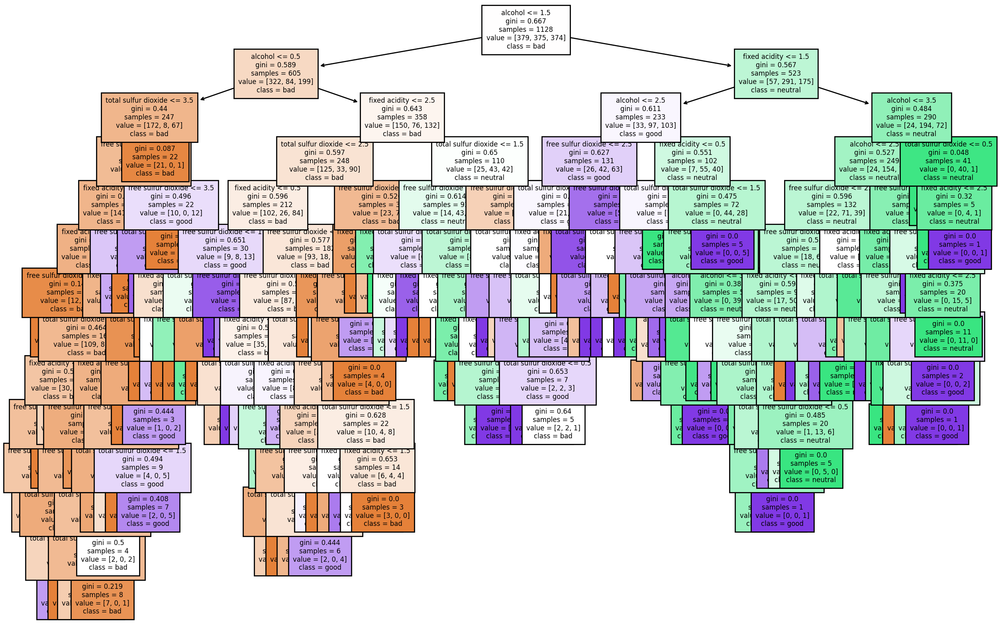

In [ ]:
fig, axes = plt.subplots(nrows = 1, ncols = 1, figsize = (15,10), dpi=200)
axes.plot(linewidth=0)
_ = plot_tree(decision_tree,
              feature_names = X.columns,
              class_names=class_names,
              filled=True,
              fontsize=6)

Unless we apply some early stopping or pruning techniques, decision trees are highly prone to overfitting, Decision Tree is highly prone to overfitting.

In [ ]:
y_pred = decision_tree.predict(X_test)

In [ ]:
pd.DataFrame([y_pred, y_test], index=['Predicted', 'True'])

,0,1,2,3,4,5,6,7,8,9,...,272,273,274,275,276,277,278,279,280,281
Predicted,bad,bad,good,bad,neutral,good,bad,bad,good,bad,...,bad,bad,good,bad,neutral,good,bad,bad,bad,neutral
True,bad,neutral,good,bad,neutral,neutral,bad,bad,good,bad,...,bad,bad,good,neutral,neutral,good,neutral,bad,bad,neutral


Text(50.722222222222214, 0.5, 'True Labels')

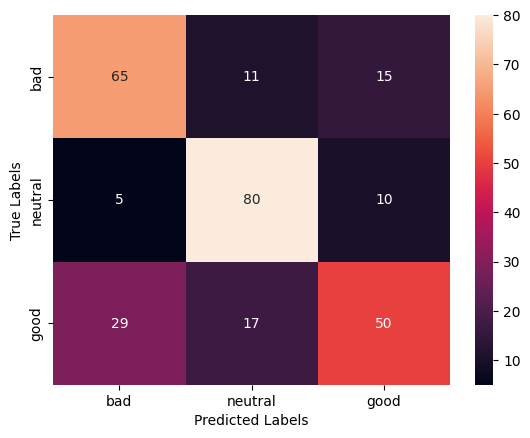

In [ ]:
# Confusion matrix
con_matrix = confusion_matrix(y_test, y_pred)
ax = sns.heatmap(con_matrix, annot=True, fmt='d', xticklabels = y.unique(), yticklabels = y.unique())
ax.set_xlabel('Predicted Labels')
ax.set_ylabel('True Labels')

In [ ]:
class_report = classification_report(y_test, y_pred)
print(class_report)

              precision    recall  f1-score   support

         bad       0.66      0.71      0.68        91
        good       0.74      0.84      0.79        95
     neutral       0.67      0.52      0.58        96

    accuracy                           0.69       282
   macro avg       0.69      0.69      0.69       282
weighted avg       0.69      0.69      0.69       282



### Taking max_depth = 6

In [ ]:
decision_tree = DecisionTreeClassifier(criterion='gini', random_state = 42, max_depth=3)
decision_tree.fit(X_train, y_train)

DecisionTreeClassifier(max_depth=3, random_state=42)

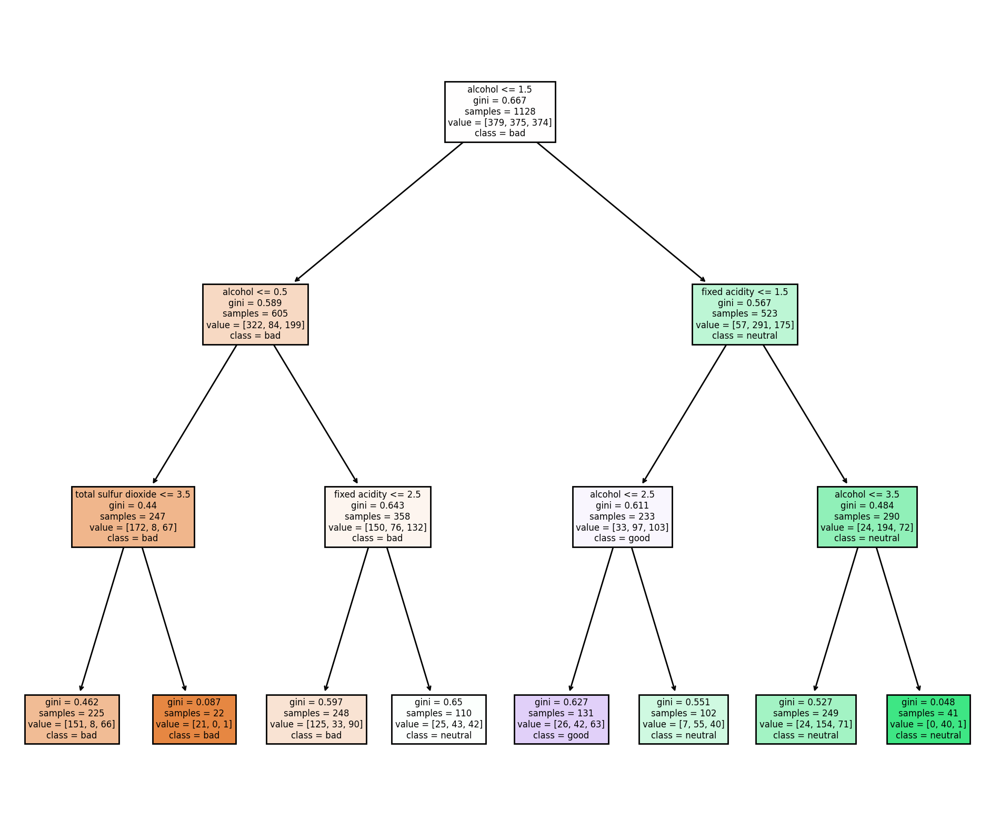

In [ ]:
fig, axes = plt.subplots(nrows = 1, ncols = 1, figsize = (12,10), dpi=200)
axes.plot(linewidth=0)
_ = plot_tree(decision_tree,
              feature_names = X.columns,
              class_names=class_names,
              filled=True)

Unless we apply some early stopping or pruning techniques, decision trees are highly prone to overfitting, Decision Tree is highly prone to overfitting.

In [ ]:
y_pred = decision_tree.predict(X_test)

In [ ]:
pd.DataFrame([y_pred, y_test], index=['Predicted', 'True'])

,0,1,2,3,4,5,6,7,8,9,...,272,273,274,275,276,277,278,279,280,281
Predicted,bad,bad,bad,bad,good,neutral,bad,bad,good,bad,...,good,bad,good,neutral,good,good,good,good,bad,bad
True,bad,neutral,good,bad,neutral,neutral,bad,bad,good,bad,...,bad,bad,good,neutral,neutral,good,neutral,bad,bad,neutral


Text(50.722222222222214, 0.5, 'True Labels')

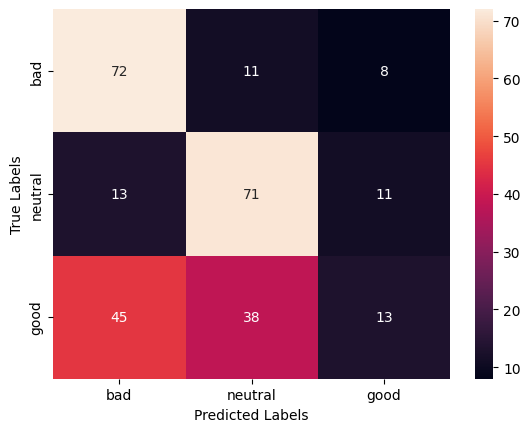

In [ ]:
# Confusion matrix
con_matrix = confusion_matrix(y_test, y_pred)
ax = sns.heatmap(con_matrix, annot=True, fmt='d', xticklabels = y.unique(), yticklabels = y.unique())
ax.set_xlabel('Predicted Labels')
ax.set_ylabel('True Labels')

In [ ]:
class_report = classification_report(y_test, y_pred)
print(class_report)

              precision    recall  f1-score   support

         bad       0.55      0.79      0.65        91
        good       0.59      0.75      0.66        95
     neutral       0.41      0.14      0.20        96

    accuracy                           0.55       282
   macro avg       0.52      0.56      0.51       282
weighted avg       0.52      0.55      0.50       282

